## Audio Scene Classification

### Features to be Extracted:

**melspectrogram:** Compute a Mel-scaled power spectrogram

**mfcc:** Mel-frequency cepstral coefficients

**chorma-stft:** Compute a chromagram from a waveform or power spectrogram

**spectral_contrast:** Compute spectral contrast

**tonnetz:** Computes the tonal centroid features (tonnetz)

In [1]:
# Import Dependencies
import os
import time
from tqdm import tqdm
import pickle
import glob
import numpy as np
import warnings
warnings.filterwarnings('ignore')
# Librosa for Audio File Processing
import librosa
from librosa import display
# Dependencies to plot the Data
import matplotlib.pyplot as plt
from matplotlib.pyplot import style,specgram
style.use('ggplot')
%matplotlib inline

In [2]:
# Create a Directory to Save Training and Testing Data and the Output Images
trainingData = './trainingData/'
testingData = './testingData/'
outputImages = './Outputs/'

if not os.path.exists(trainingData):
    os.makedirs(trainingData)

if not os.path.exists(testingData):
    os.makedirs(testingData)

if not os.path.exists(outputImages):
    os.makedirs(outputImages)

### Class for Audio Feature Extraction

In [3]:
# Class for Extracting and Plotting Audio Features
class audioFeatureExtractor():
    
    # Initialize function
    def __init__(self, filePath, fileLabel, parent_dir, train_dir=None, test_dir=None, file_ext='*.wav'):
        self.audioFilePath = filePath
        self.audioFileLabel = fileLabel
        self.parentDirectory = parent_dir
        self.trainingDataDir = train_dir
        self.testDataDir = test_dir
        self.audioFileExtension = file_ext
        

    # Read in the Audio Files in .wav format
    def readAudioFiles(self):
        rawAudio = []
        for file in tqdm(self.audioFilePath):
            data,samplingRate = librosa.load(file)
            rawAudio.append(data)
        return rawAudio,samplingRate
    
    
    # Function to Parse and Process all Audio Files and their Labels
    def processAudioFiles(self,sub_dirs=None):
        features, labels = np.empty((0,193)), np.empty(0)
        for label, sub_dir in enumerate(sub_dirs):
            print('\nSub Dir: ',sub_dir)
            for fn in tqdm(glob.glob(os.path.join(self.parentDirectory, sub_dir, self.audioFileExtension))):
                try:
                    mfccs, chroma, mel, contrast,tonnetz = self.extractFeatures(file_path=fn)
                except Exception as e:
                    print ("Error encountered while parsing file: ", fn)
                    continue
                ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
                features = np.vstack([features,ext_features])
                labels = np.append(labels, fn.split('/')[2].split('-')[1])
        return np.array(features), np.array(labels, dtype = np.int)    
    
    
    # Function to Extract the Useful Features
    # Returns: the list of values of extracted features
    def extractFeatures(self, file_path):
        # Load the Audio Files
        # Returns: Audio Data, Sampling Rate
        data, sample_rate = librosa.load(file_path)
        # Apply STFT to Raw Audio Data
        stft = np.abs(librosa.stft(data))
        # Calculate Mel-Frequency Cepstral Coefficient [MFCC]
        MFCC = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=40).T, axis=0)
        # Calculate Mel Spectrogram for Audio
        melSpectrogram = np.mean(librosa.feature.melspectrogram(data, sr=sample_rate).T, axis=0)
        # Calculate the Chroma for Audio Files
        chromaSTFT = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
        # Calculate Spectral Contrast for Audio
        spectralContrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T, axis=0)
        # Calculate Tonal Centroid Features for Audio
        tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(data), sr=sample_rate).T, axis=0)
        return MFCC, chromaSTFT, melSpectrogram, spectralContrast, tonnetz
    
    
    # One Hot Encoding the Labels of Audio
    def one_hot_encode(self, audioLabels=None):
        labels = len(audioLabels)
        unique_labels = len(np.unique(audioLabels))
        # Create an Array with all Zeros
        # Size of Array: labels,unique_labele
        one_hot_encoding = np.zeros((labels,unique_labels))
        # Representing the existing labels in array as "1"
        one_hot_encoding[np.arange(labels), audioLabels] = 1
        return one_hot_encoding
    
    
    # Function to load Extracted Features
    # Returns: Training (Features, Labels) , Test (Features, Labels)
    def getExtractedFeatures(self, load_saved=False):
        if load_saved == True:
            with open('./trainingData/trainingFeatures.pkl', 'rb') as file:
                X_train = pickle.load(file)
            with open('./trainingData/trainingLabels.pkl', 'rb') as file:
                y_train = pickle.load(file)
            with open('./testingData/testFeatures.pkl', 'rb') as file:
                X_test = pickle.load(file)
            with open('./testingData/testingLabels.pkl', 'rb') as file:
                y_test = pickle.load(file)
        elif load_saved == False:
            # Training Audio Files Features and Labels
            X_train, y_train = self.processAudioFiles(sub_dirs= self.trainingDataDir)
            X_test, y_test = self.processAudioFiles(sub_dirs= self.testDataDir)
            print('\nPROCESSING COMPLETE !!')
            
            # Save Extracted Features
            trainingFeatures = open('./trainingData/trainingFeatures.pkl', 'wb')
            pickle.dump(X_train, trainingFeatures)
            trainingFeatures.close()

            testingFeatures = open('./testingData/testFeatures.pkl', 'wb')
            pickle.dump(X_test, testingFeatures)
            testingFeatures.close()
            
            # One Hot Encoding the Labels
            y_train = self.one_hot_encode(y_train)
            y_test = self.one_hot_encode(y_test)

            # Save the Labels
            trainingLabels = open('./trainingData/trainingLabels.pkl', 'wb')
            pickle.dump(y_train, trainingLabels)
            trainingLabels.close()

            testingLabels = open('./testingData/testingLabels.pkl', 'wb')
            pickle.dump(y_test, testingLabels)
            testingLabels.close()
        # Return Training and Test Features and Labels
        return (X_train, y_train), (X_test, y_test)
    
    
    # Plot Extracted Features from Raw Audio
    def plotExtractedFeatures(self,rawInputAudio,samplingRate):
        for i in range(len(self.audioFileLabel)):
            fig = plt.figure(figsize=(25, 50))
            fig.subplots_adjust(hspace=0.5)
            plt.subplot(7,1,1)
            audio = np.array(rawInputAudio[i])
            # Plot Raw Audio Data
            librosa.display.waveplot(audio, sr=samplingRate)
            plt.title('Raw Audio Data')
            # Plot Audio Spectrogram
            plt.subplot(7, 1, 2)
            specgram(audio, Fs=samplingRate)
            plt.xlabel('Time')
            plt.ylabel('Hz')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Audio Spectrogram')
            # Plot Log Power Spectrum for Audio
            plt.subplot(7,1,3)
            D = librosa.core.amplitude_to_db(np.abs(librosa.stft(audio)) ** 2, ref=np.max)
            librosa.display.specshow(D, x_axis='time', y_axis='log')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Log Power Spectrum')
            # Plot Audio MFCC
            plt.subplot(7,1,4)
            mfccs = librosa.feature.mfcc(y=audio, sr=samplingRate, n_mfcc=40)
            display.specshow(mfccs, x_axis='time')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Mel-Frequency Cepstral Coefficient [MFCC]')
            # Plot Chroma STFT
            plt.subplot(7, 1, 5)
            S_chroma = np.abs(librosa.stft(audio, n_fft=4096)) ** 2
            chroma = librosa.feature.chroma_stft(S=S_chroma, sr=samplingRate)
            display.specshow(chroma, y_axis='chroma', x_axis='time')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Chroma STFT')
            # Plot Mel Spectrogram
            plt.subplot(7, 1, 6)
            S_mel = librosa.feature.melspectrogram(y=audio, sr=samplingRate, n_mels=128, fmax=8000)
            display.specshow(librosa.power_to_db(S_mel, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Audio Mel Spectrogram')
            # Plot Tonnetz
            plt.subplot(7, 1, 7)
            y_tonnetz = librosa.effects.harmonic(audio)
            tonnetz = librosa.feature.tonnetz(y=y_tonnetz, sr=samplingRate)
            display.specshow(tonnetz, y_axis='tonnetz')
            plt.colorbar(format='%+2.0f dB')
            plt.title('Audio Tonal Centroid Features')
            plt.tight_layout()
            path = str('Outputs/'+self.audioFileLabel[i]+'_features'+'.jpg')
            fig.savefig(path)
        print('FEATURES EXTRACTED, IMAGES SAVED TO PATH: ./Outputs/')

In [4]:
# Audio File Paths
audioFilePath = ['testAudioData/57320-0-0-7.wav','testAudioData/24074-1-0-3.wav','testAudioData/15564-2-0-1.wav','testAudioData/31323-3-0-1.wav','testAudioData/46669-4-0-35.wav','testAudioData/89948-5-0-0.wav','testAudioData/40722-8-0-4.wav','testAudioData/103074-7-3-2.wav','testAudioData/106905-8-0-0.wav','testAudioData/108041-9-0-4.wav']

# Audio File Labels
audioFileLabel = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling", "gun shot","jackhammer","siren","street music"]

# Data Parent Directory
parentDataDir = 'dataset'

# Directories used for Training Data
trainingDataDirs = ['fold6', 'fold7', 'fold8']

# Directories used for Test Data
testingDataDir = ['fold9']

In [5]:
# Initialize Class Object
afe = audioFeatureExtractor(audioFilePath, audioFileLabel, parent_dir=parentDataDir, train_dir=trainingDataDirs, test_dir=testingDataDir)

In [6]:
# Read Audio Files
# Returns: rA: "Raw Audio Values", sR: "Sampling Rate"
rA,sR = afe.readAudioFiles()

100%|██████████| 10/10 [00:01<00:00,  7.77it/s]


In [7]:
print("Sampling Rate: ",sR)

Sampling Rate:  22050


FEATURES EXTRACTED, IMAGES SAVED TO PATH: ./Outputs/


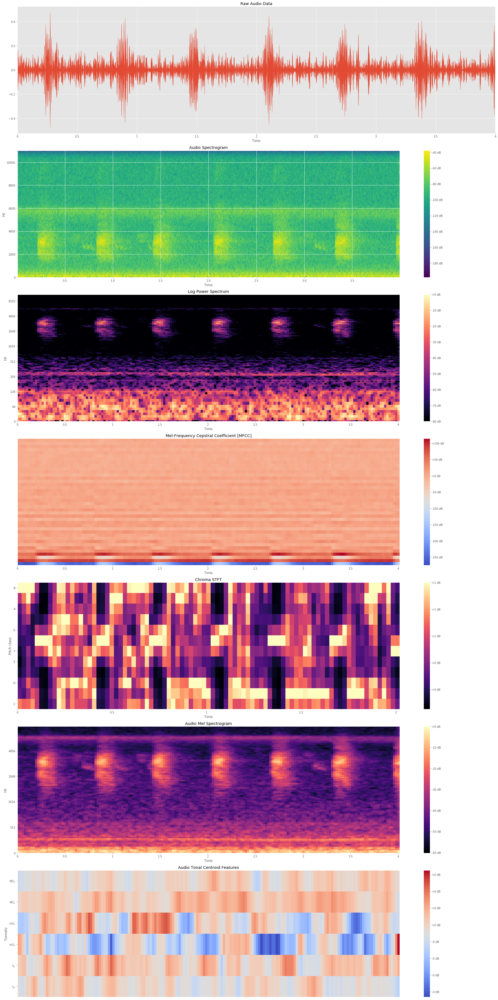

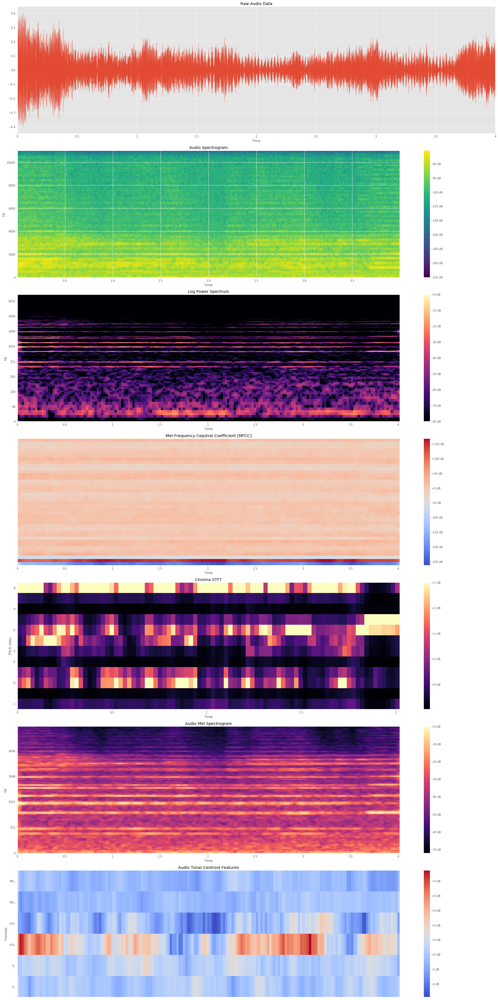

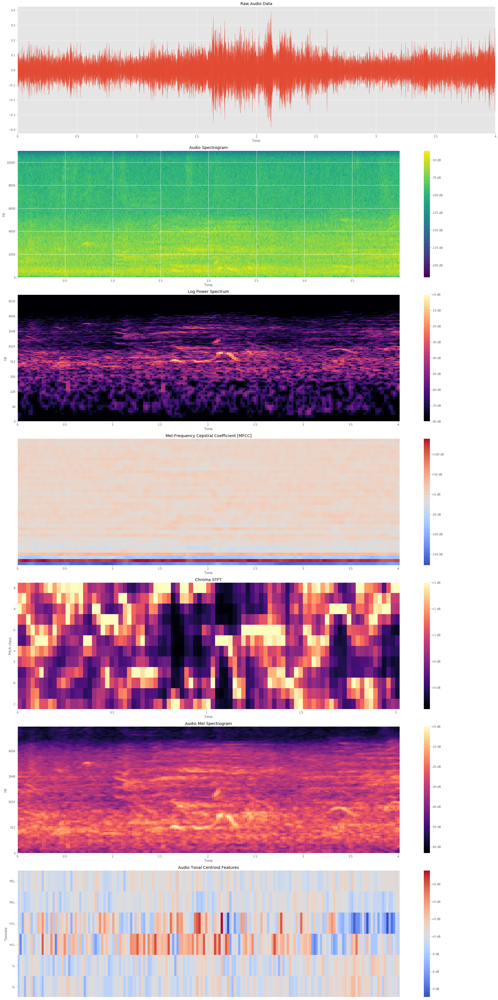

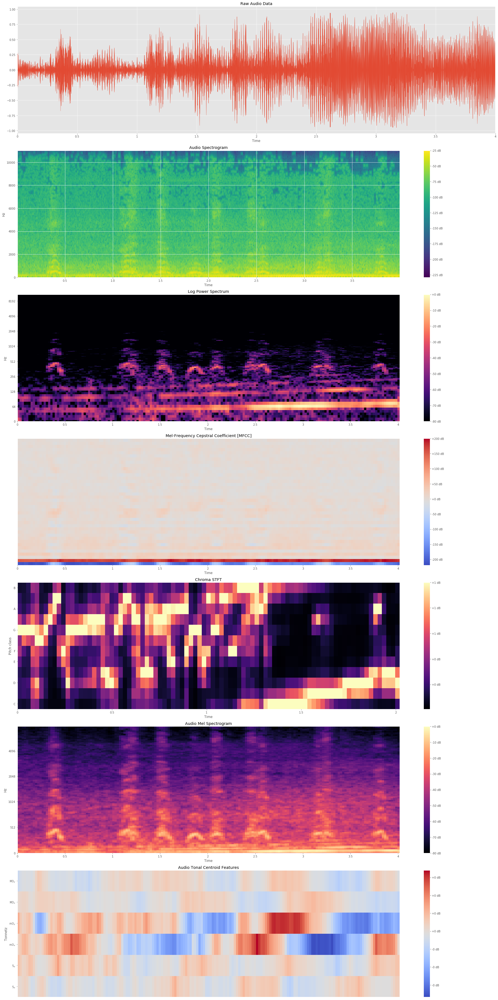

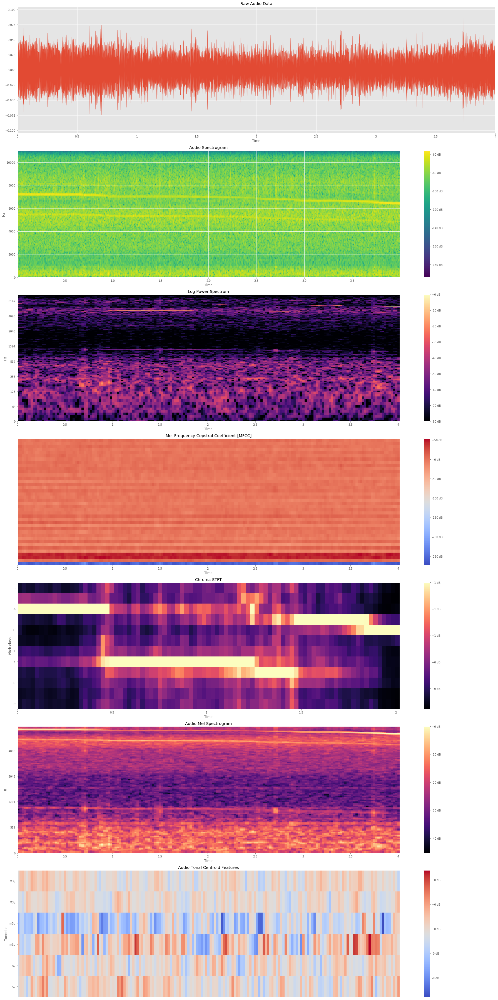

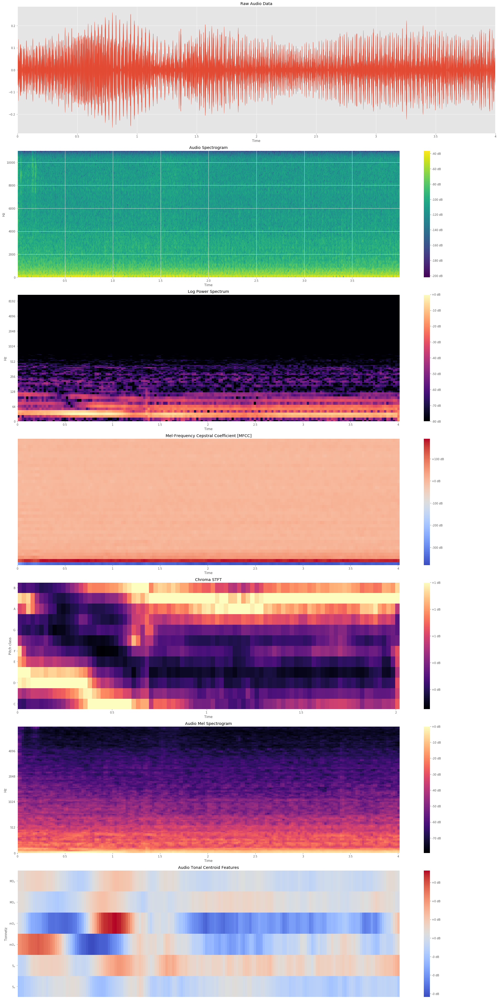

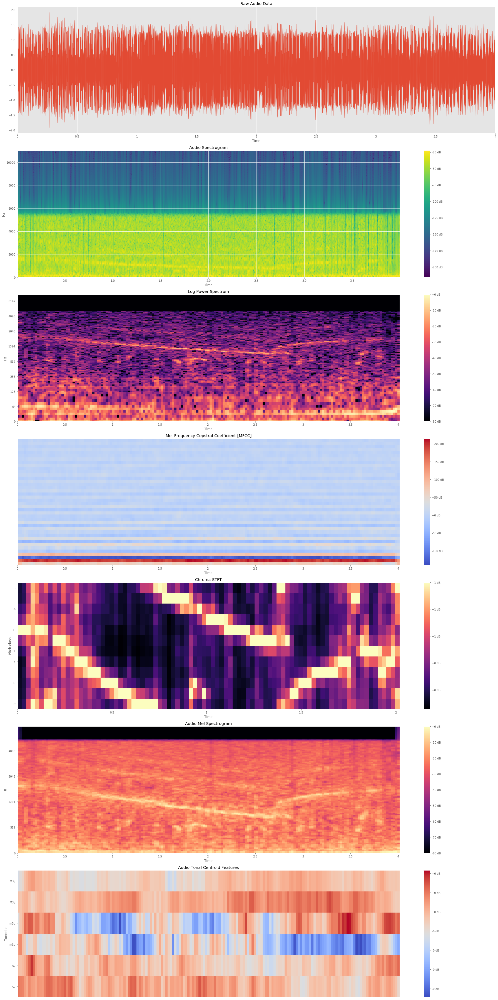

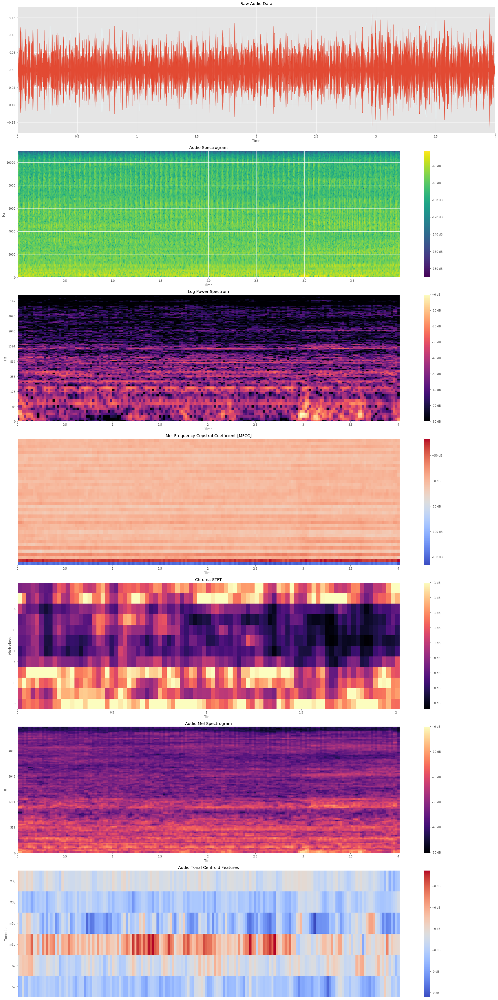

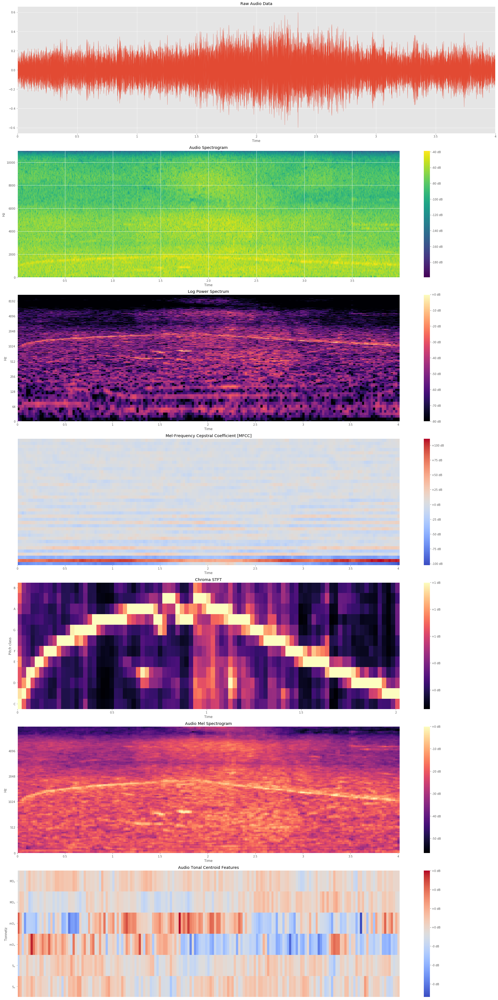

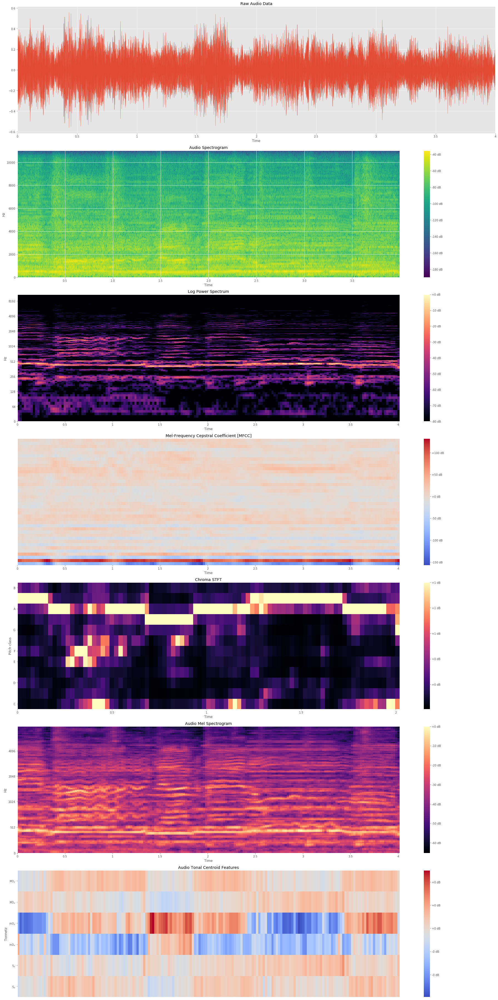

In [8]:
# Plot Extracted Features from 10 sample Audio Files
# Returns: Plot of "Raw Audio Signal", "MFCC", "chroma STFT", "mel Spectrogram", "spectral Contrast", "tonnetz" for each Audio File.
afe.plotExtractedFeatures(rA, sR)

In [9]:
# Get the Features for a single Audio File
# Returns: "MFCC", "chroma STFT", "mel Spectrogram", "spectral Contrast", "tonnetz" feature Values.
mfcc, chroma_STFT, mel_Spectrogram, spectral_Contrast, tonnetZ = afe.extractFeatures(file_path='./testAudioData/57320-0-0-7.wav')

In [10]:
mfcc

array([-2.23188986e+02,  7.90165067e+01,  4.85495567e+00,  6.84270140e+01,
        2.03011492e+01,  1.78145210e+01, -1.10357743e+00,  1.48252573e+01,
        1.56120621e+00,  2.92974030e+00,  1.31184461e+01, -7.81936942e+00,
        8.92370831e+00,  1.16543972e+01, -7.79177670e+00,  1.52337710e+01,
       -5.57244977e+00,  8.90828637e+00, -1.80370051e-02,  4.30085967e+00,
        6.60885848e+00,  2.18670304e+00,  7.31190701e+00,  7.04113692e+00,
        4.52668346e-01,  7.87097022e+00, -3.73651645e+00,  7.20097085e+00,
       -3.69957651e+00,  1.41817847e+00, -2.52894528e+00, -2.33151889e+00,
       -1.03065313e+00, -2.15691287e+00, -2.94733210e+00,  6.73098632e-01,
       -5.61524161e+00,  1.10305438e+00, -5.02971642e+00,  2.48619879e-01])

In [11]:
chroma_STFT

array([0.70592052, 0.75467382, 0.7336884 , 0.67866763, 0.77703184,
       0.92931916, 0.84940412, 0.73122457, 0.69148254, 0.63534495,
       0.62381844, 0.64645774])

In [12]:
mel_Spectrogram

array([2.56586797e+01, 2.43643681e+01, 1.62476300e+01, 5.91003870e+00,
       4.39887547e+00, 7.06376824e-01, 3.48028369e-01, 4.15562692e-01,
       2.15717574e-01, 5.96649201e-01, 2.05549265e+00, 1.08667334e+00,
       2.76455810e-01, 2.70120383e-01, 1.54844112e-01, 1.12213729e-01,
       9.30143364e-02, 8.56519013e-02, 6.17917388e-02, 6.53528270e-02,
       6.01463592e-02, 4.54900853e-02, 7.05019743e-02, 3.62150548e-02,
       2.24581816e-02, 1.68618077e-02, 1.42985518e-02, 1.22961951e-02,
       1.13084068e-02, 1.08719363e-02, 9.18725647e-03, 8.97273254e-03,
       7.81268996e-03, 7.83474903e-03, 7.37138625e-03, 8.80541386e-03,
       8.34964119e-03, 7.56539532e-03, 6.35639546e-03, 6.54014768e-03,
       5.09933090e-03, 5.02739931e-03, 7.14178897e-03, 7.23342632e-03,
       5.27703814e-03, 8.19813556e-03, 7.83838009e-03, 7.67916288e-03,
       1.39583041e-02, 9.22152578e-03, 9.79829753e-03, 1.16592748e-02,
       1.08018267e-02, 1.97174790e-02, 1.86278198e-02, 5.26893558e-02,
      

In [13]:
spectral_Contrast

array([15.66029335, 12.81742391, 14.20658891, 13.61026456, 16.0447877 ,
       20.16232308, 28.65583641])

In [14]:
tonnetZ

array([-0.00990811,  0.01738494, -0.06026044, -0.01099905,  0.02415787,
       -0.00376685])

In [15]:
# Training Audio Files Features and Labels
# X_train, y_train = afe.processAudioFiles(sub_dirs=trainingDataDirs)
(X_train, y_train), (X_test, y_test) = afe.getExtractedFeatures()

  0%|          | 0/823 [00:00<?, ?it/s]


Sub Dir:  fold6


  0%|          | 0/838 [00:00<?, ?it/s]


Sub Dir:  fold7


  0%|          | 0/806 [00:00<?, ?it/s]


Sub Dir:  fold8


  0%|          | 0/816 [00:00<?, ?it/s]


Sub Dir:  fold9


100%|██████████| 816/816 [04:15<00:00,  3.00it/s]


PROCESSING COMPLETE !!


In [16]:
# Checking Shape of Train and Test Features
print("Shape of Training Features: ",X_train.shape)
print("Shape of Test Features: ",X_test.shape)

Shape of Training Features:  (2467, 193)
Shape of Test Features:  (816, 193)


In [17]:
# Checking Shape of Train and Test Labels
print("Shape of Training Labels: ",y_train.shape)
print("Shape of Test Labels: ",y_test.shape)

Shape of Training Labels:  (2467, 10)
Shape of Test Labels:  (816, 10)
